In [1]:
import os
import os.path as op
from nilearn import datasets
from nilearn import surface
from nilearn import plotting
import shinobi_behav
import matplotlib.pyplot as plt
import itertools
import matplotlib.image as mpimg
import nibabel as nb
from nilearn.plotting import plot_img_on_surf, plot_stat_map
from nilearn.glm import threshold_stats_img


def plot_fullbrain_seslevel(zmap_fname, output_path, zmap=None, title=None):
    sub = zmap_fname.split("/")[-1].split("_")[0]
    ses = zmap_fname.split("/")[-1].split("_")[1]
    modeltype = zmap_fname.split("/")[-1].split("_")[2][:-5]
    cond_name = zmap_fname.split("/")[-1].split("_")[3]
    
    if zmap==None:
        zmap = zmap_fname
    
    fsaverage = datasets.fetch_surf_fsaverage()
    texture = surface.vol_to_surf(zmap, fsaverage.pial_right)    
    # Generate each panel separately
    fig = plotting.plot_surf_stat_map(
        fsaverage.infl_right, texture, hemi='right',
        title='Lateral right', colorbar=True,
        threshold=3., bg_map=fsaverage.sulc_right, view="lateral",
        output_file=op.join(output_path, f"{sub}_{ses}_{modeltype}model_{cond_name}_lateral-right.png")
    )
    fig = plotting.plot_surf_stat_map(
        fsaverage.infl_right, texture, hemi='right',
        title='Medial right', colorbar=True,
        threshold=3., bg_map=fsaverage.sulc_right, view="medial",
        output_file=op.join(output_path, f"{sub}_{ses}_{modeltype}model_{cond_name}_medial-right.png")
    )
    texture = surface.vol_to_surf(zmap_fname, fsaverage.pial_left)
    fig = plotting.plot_surf_stat_map(
        fsaverage.infl_left, texture, hemi='left',
        title='Lateral left', colorbar=True,
        threshold=3., bg_map=fsaverage.sulc_left, view="lateral",
        output_file=op.join(output_path, f"{sub}_{ses}_{modeltype}model_{cond_name}_lateral-left.png")
    )
    fig = plotting.plot_surf_stat_map(
        fsaverage.infl_left, texture, hemi='left',
        title='Medial left', colorbar=True,
        threshold=3., bg_map=fsaverage.sulc_left, view="medial",
        output_file=op.join(output_path, f"{sub}_{ses}_{modeltype}model_{cond_name}_medial-left.png")
    )
    
    # Assemble figure
    fig = plt.figure(figsize=(10,10))
    fig.suptitle(f"{sub} {ses} {cond_name}")
    for idx, view in enumerate(itertools.product(["lateral", "medial"], ["left", "right"])):
        img_fpath = op.join(output_path, f"{sub}_{ses}_{modeltype}model_{cond_name}_{view[0]}-{view[1]}.png")
        img = mpimg.imread(img_fpath)
        ax = fig.add_subplot(2, 2, idx+1)
        imgplot = plt.imshow(img)
        ax.set_title(f'{view[0]} {view[1]}')
        plt.axis('off')
        plt.tight_layout()


def create_viz(sub, ses, cond_name, path_to_data, figures_path):
    output_path = op.join(figures_path, "ses-level", cond_name, "z_maps", sub, ses)
    os.makedirs(output_path, exist_ok=True)

/home/hyruuk/python_envs/shinobi_env/lib/python3.7/site-packages/nilearn/__init__.py:69: FutureWarning: Python 3.7 support is deprecated and will be removed in release 0.12 of Nilearn. Consider switching to Python 3.9 or 3.10.
  _python_deprecation_warnings()


## Paths and constants

In [3]:
sub = "sub-01"
ses = "ses-006"
cond_name = 'HIT+JUMP-RIGHT-LEFT-UP-DOWN'#"Kill"
modeltype = "full"

figures_path = shinobi_behav.FIG_PATH
path_to_data = shinobi_behav.DATA_PATH
folderpath = op.join(path_to_data, "processed", "z_maps", "ses-level")
output_path = op.join(figures_path, "ses-level", cond_name, "z_maps", sub, ses)
os.makedirs(output_path, exist_ok=True)


z_map = op.join(folderpath, cond_name, f"{sub}_{ses}_{modeltype}model_{cond_name}.nii.gz")
zmap_fname = z_map
print(z_map)

/scratch/hyruuk/neuromod/shinobi2023/processed/z_maps/ses-level/HIT+JUMP-RIGHT-LEFT-UP-DOWN/sub-01_ses-006_fullmodel_HIT+JUMP-RIGHT-LEFT-UP-DOWN.nii.gz


## Load anatomy

/home/hyruuk/python_envs/shinobi_env/lib/python3.7/site-packages/numpy/core/fromnumeric.py:755: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)



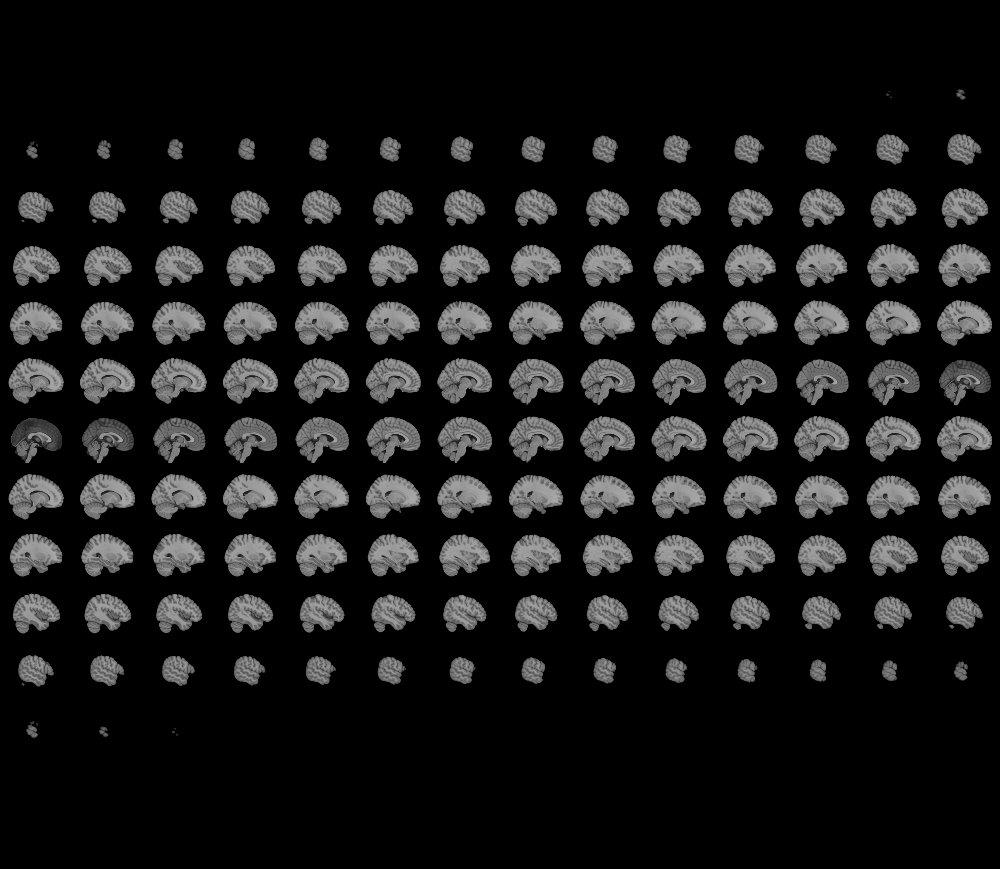
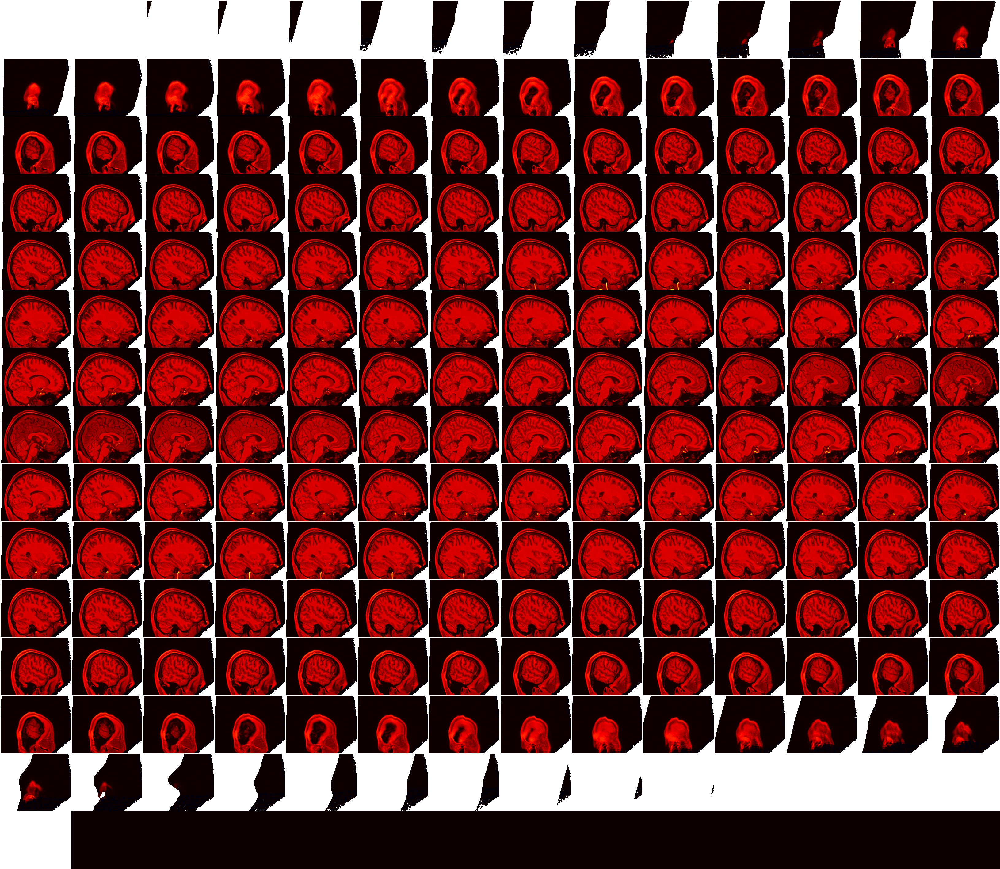

In [4]:
anat_fname = op.join(
    path_to_data,
    "cneuromod.processed",
    "smriprep",
    sub,
    "anat",
    f"{sub}_space-MNI152NLin2009cAsym_desc-preproc_T1w.nii.gz",
)
bg_img = nb.load(anat_fname)
plotting.view_img(bg_img)

## Threshold maps

In [5]:
# compute thresholds
uncorrected_map, threshold = threshold_stats_img(z_map, alpha=.001, height_control='fpr')
cluster_corrected_map, threshold = threshold_stats_img(z_map, alpha=.05, height_control='fdr', cluster_threshold=10)

### Unthresholded map

(<Figure size 288x360 with 5 Axes>,
 [<Axes3DSubplot:>,
  <Axes3DSubplot:>,
  <Axes3DSubplot:>,
  <Axes3DSubplot:>,
  <AxesSubplot:>])

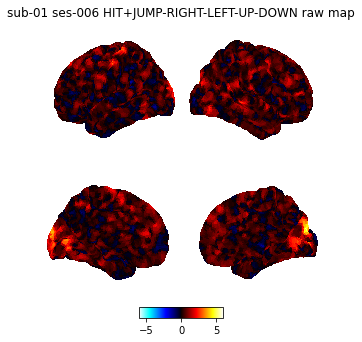

In [6]:
plot_img_on_surf(zmap_fname, vmax=6, title=f'{sub} {ses} {cond_name} raw map')

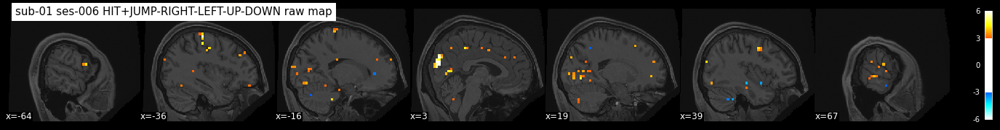

In [7]:
plot_stat_map(zmap_fname, threshold=3, bg_img=bg_img, vmax=6, display_mode='x', title=f'{sub} {ses} {cond_name} raw map')

/home/hyruuk/python_envs/shinobi_env/lib/python3.7/site-packages/numpy/core/fromnumeric.py:755: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)



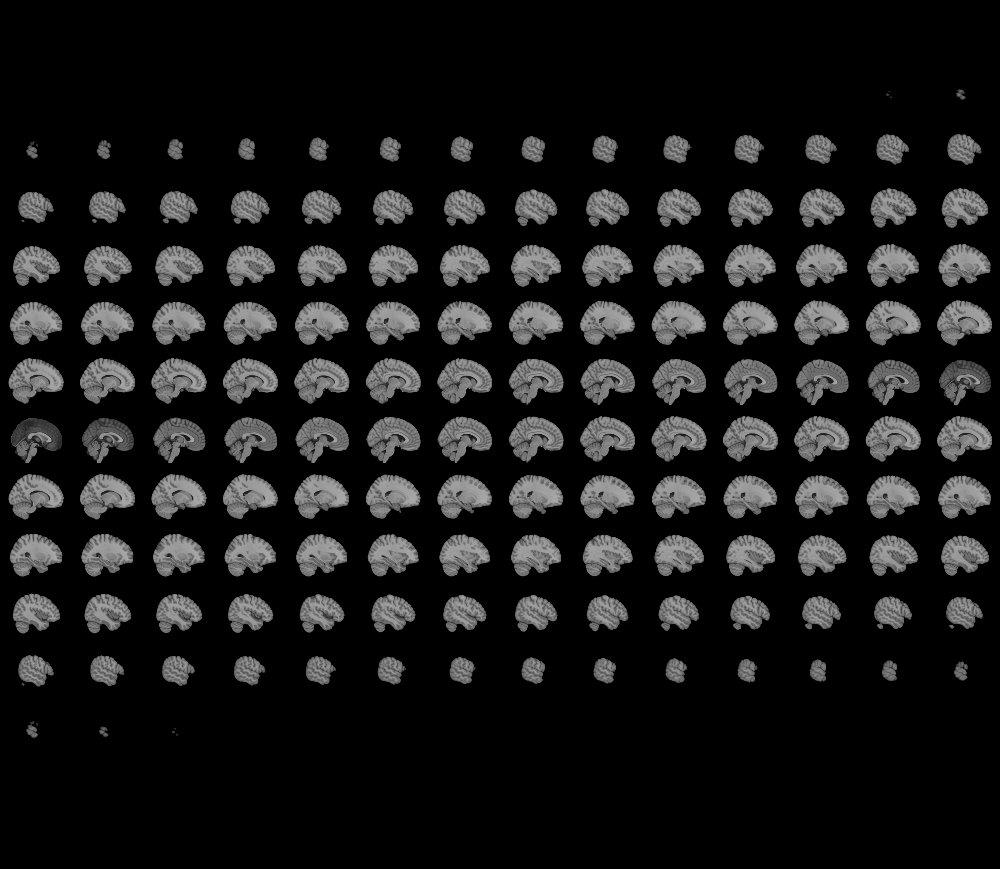
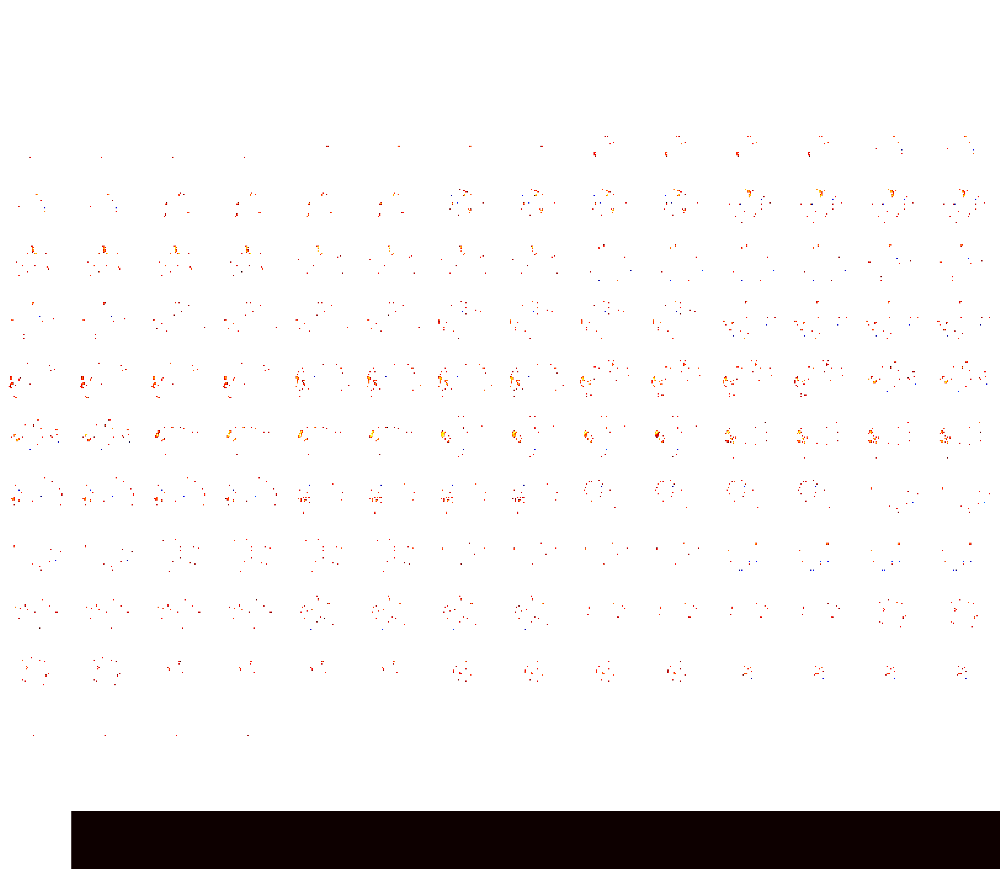

In [8]:
plotting.view_img(zmap_fname, threshold=3, title=f'{sub} {ses} {cond_name} raw map')

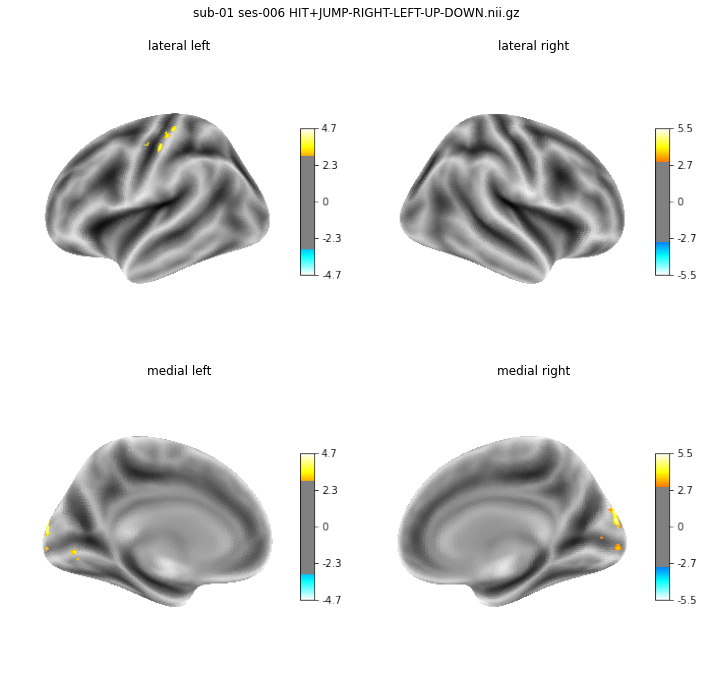

In [9]:
plot_fullbrain_seslevel(zmap_fname, output_path, zmap=None, title=f'{sub} {ses} {cond_name} raw map')

### Thresholded map

(<Figure size 288x360 with 5 Axes>,
 [<Axes3DSubplot:>,
  <Axes3DSubplot:>,
  <Axes3DSubplot:>,
  <Axes3DSubplot:>,
  <AxesSubplot:>])

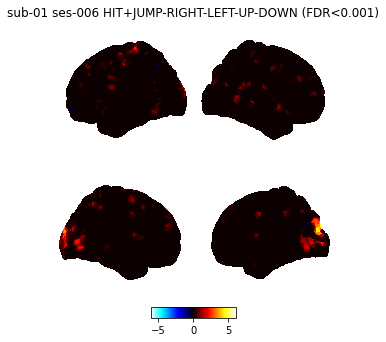

In [10]:
plot_img_on_surf(uncorrected_map, bg_img=bg_img, vmax=6, title=f'{sub} {ses} {cond_name} (FDR<0.001)')

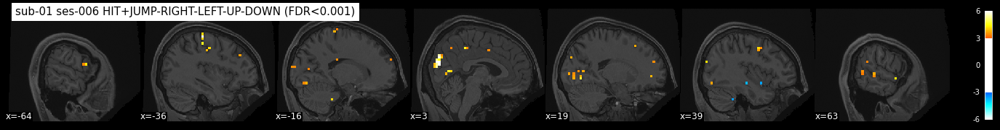

In [11]:
plot_stat_map(uncorrected_map, threshold=3, bg_img=bg_img, vmax=6, display_mode='x', title=f'{sub} {ses} {cond_name} (FDR<0.001)')

/home/hyruuk/python_envs/shinobi_env/lib/python3.7/site-packages/numpy/core/fromnumeric.py:755: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)



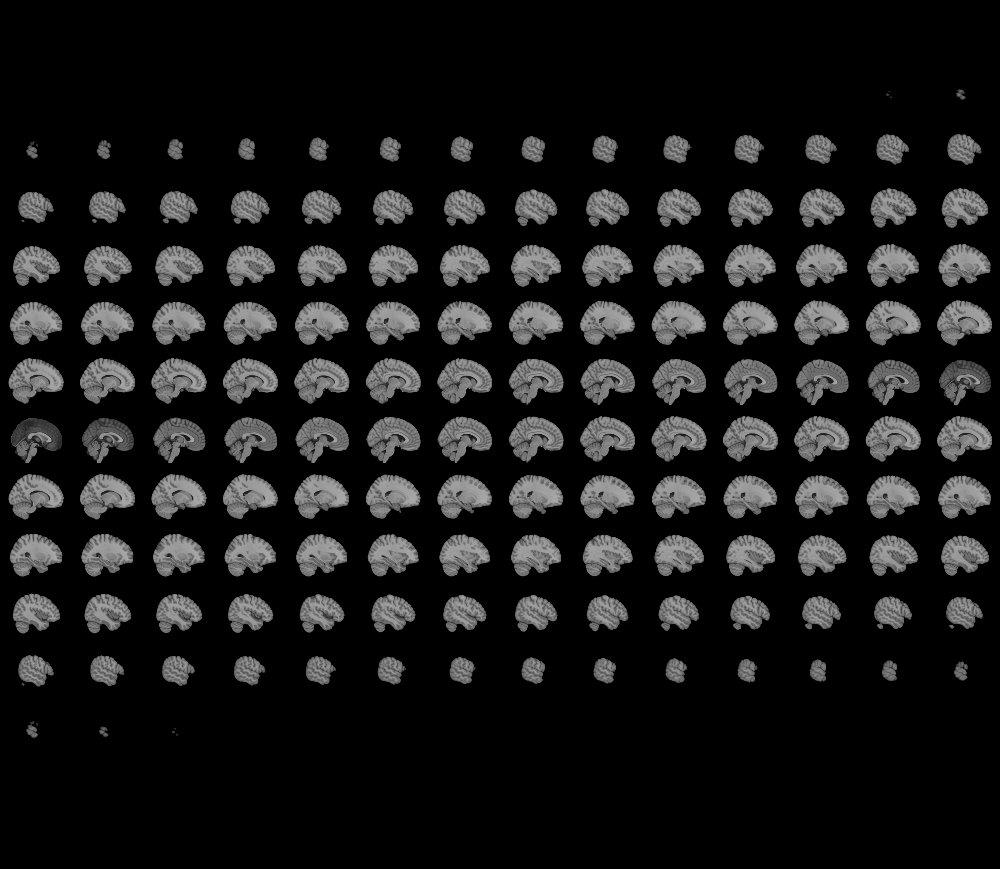
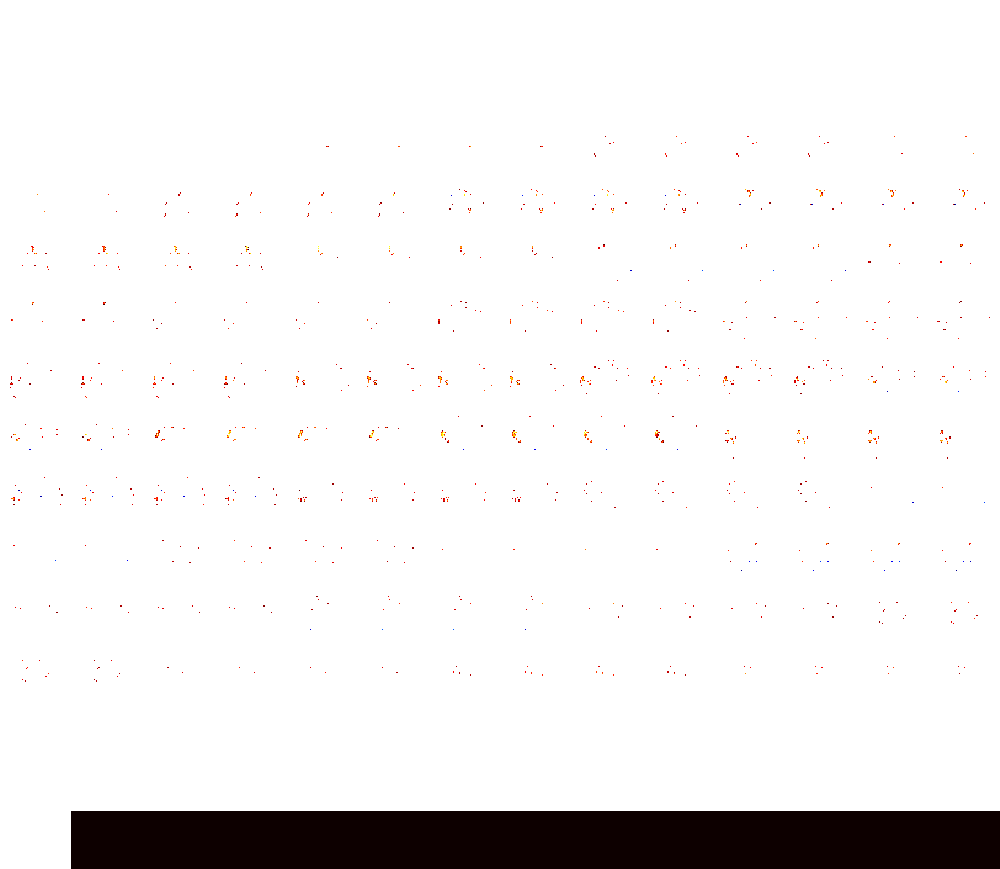

In [12]:
plotting.view_img(uncorrected_map, threshold=3, title=f'{sub} {ses} {cond_name} (FDR<0.001)')

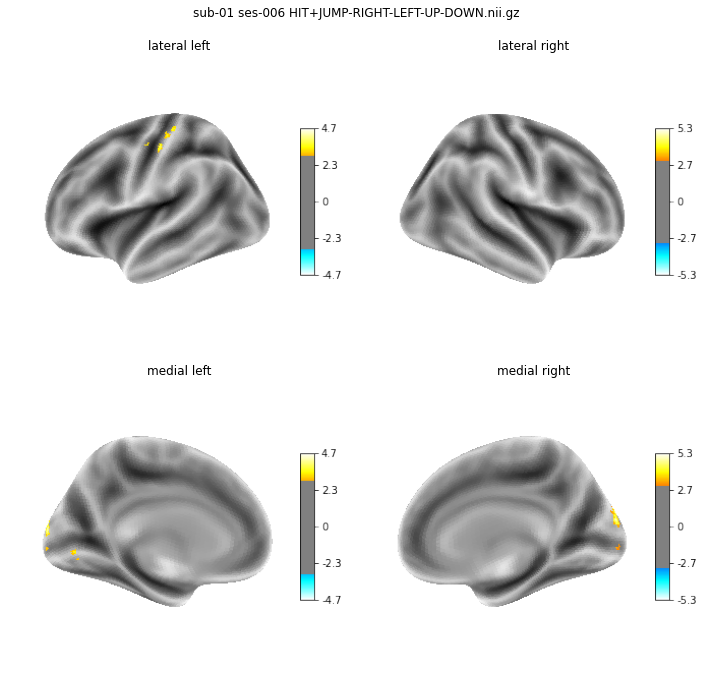

In [13]:
plot_fullbrain_seslevel(zmap_fname, output_path, zmap=uncorrected_map, title=f'{sub} {ses} {cond_name} (FDR<0.001)')

### Thresholded + cluster correction

(<Figure size 288x324 with 5 Axes>,
 [<Axes3DSubplot:>,
  <Axes3DSubplot:>,
  <Axes3DSubplot:>,
  <Axes3DSubplot:>,
  <AxesSubplot:>])

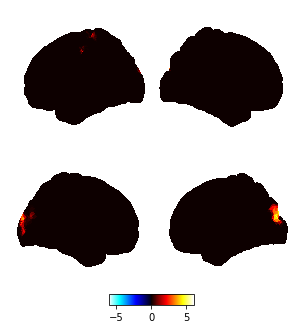

In [14]:
plot_img_on_surf(cluster_corrected_map, bg_img=bg_img, vmax=6)

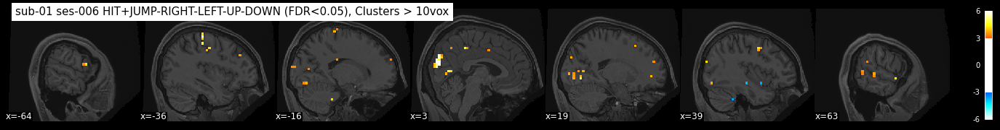

In [15]:
plot_stat_map(uncorrected_map, threshold=3, bg_img=bg_img, vmax=6, display_mode='x', title=f'{sub} {ses} {cond_name} (FDR<0.05), Clusters > 10vox')

/home/hyruuk/python_envs/shinobi_env/lib/python3.7/site-packages/numpy/core/fromnumeric.py:755: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)



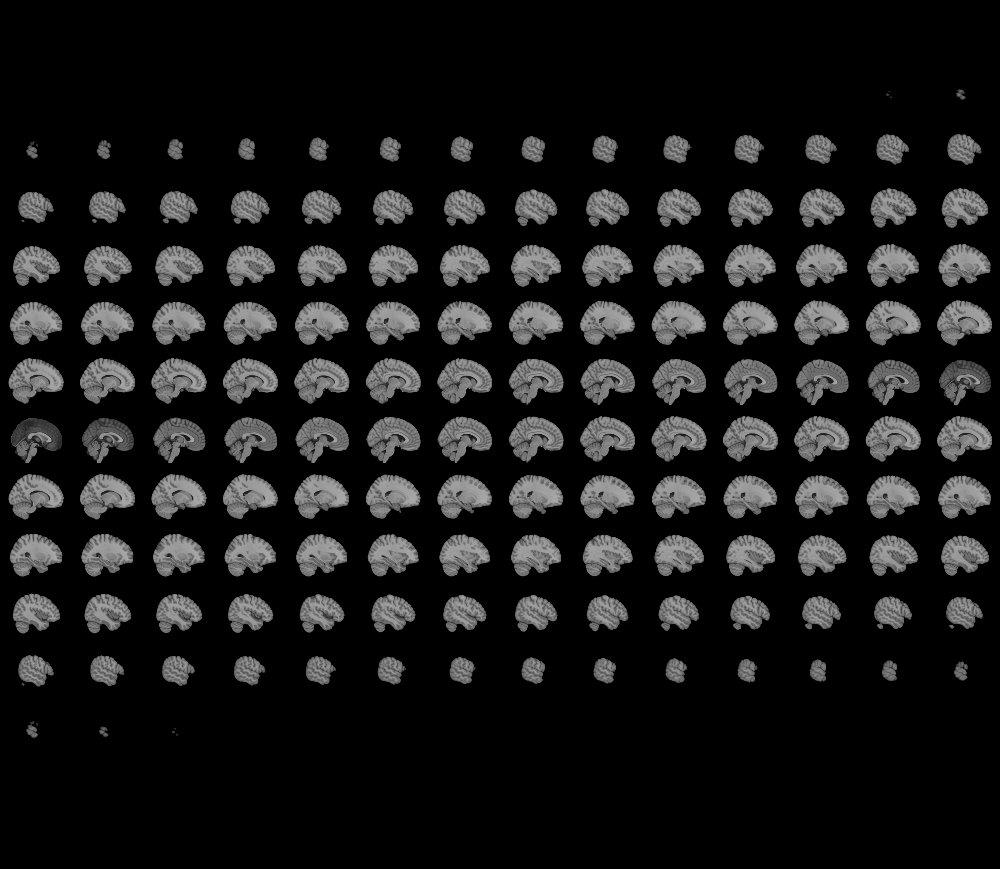
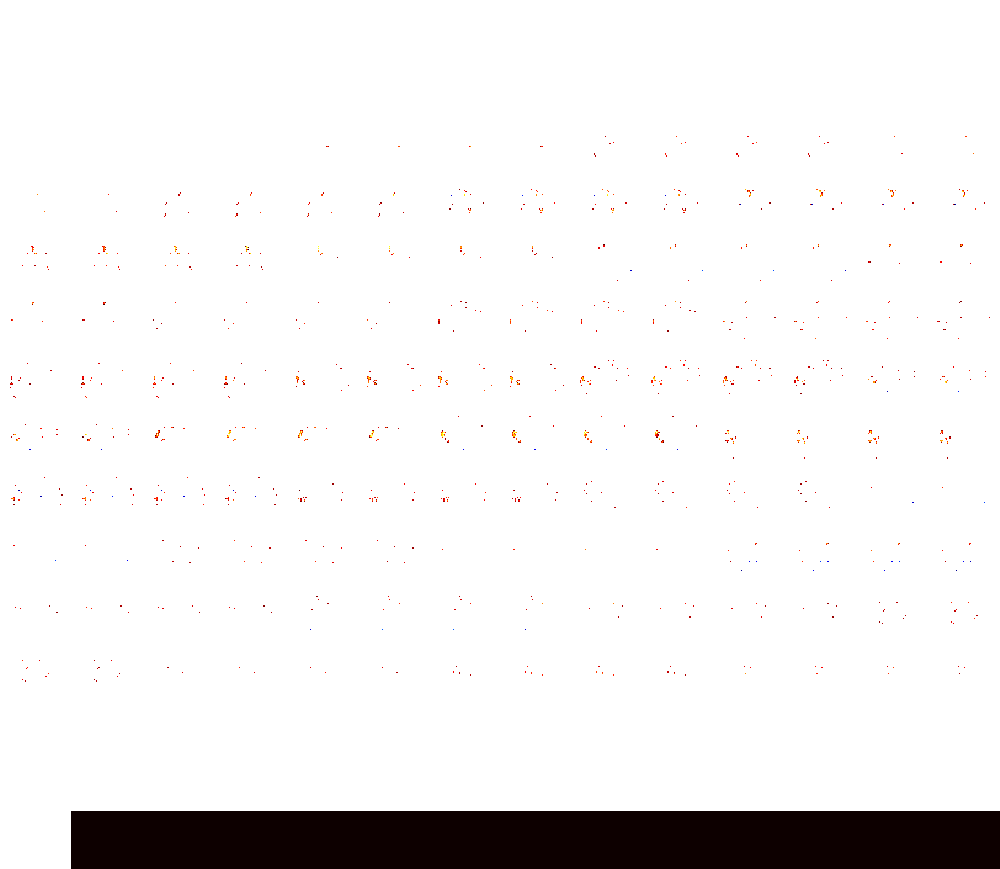

In [16]:
plotting.view_img(uncorrected_map, threshold=3, title=f'{sub} {ses} {cond_name} (FDR<0.05), Clusters > 10vox')

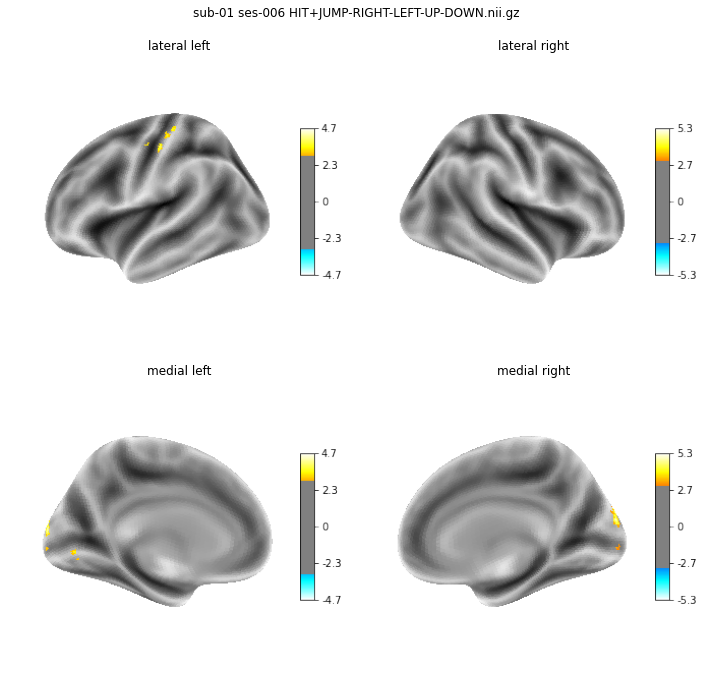

In [17]:
plot_fullbrain_seslevel(zmap_fname, output_path, zmap=uncorrected_map, title=f'{sub} {ses} {cond_name} (FDR<0.05), Clusters > 10vox')

# Deprecated

In [59]:
plot_stat_map(uncorr_map, bg_img=bg_img, vmax=6, display_mode='x')#, output_file=op.join(shinobi_behav.figures_path, 'subject-level-from-session', contrast, f'{sub}_{ses}_{contrast}_slices_uncorr.png'))

NameError: name 'uncorr_map' is not defined

In [ ]:
plot_fullbrain_seslevel(z_map, )

In [ ]:
engine = 'plotly'
# If plotly is not installed, use matplotlib
try:
    import plotly.graph_objects as go  # noqa: F401
except ImportError:
    engine = 'matplotlib'

print(f"Using plotting engine {engine}.")
fsaverage = datasets.fetch_surf_fsaverage()
texture = surface.vol_to_surf(zmap_fname, fsaverage.pial_right)

fig = plotting.plot_surf_stat_map(
    fsaverage.infl_right, texture, hemi='right',
    title='Surface right hemisphere', colorbar=True,
    threshold=1., bg_map=fsaverage.sulc_right,
    engine=engine  # Specify the plotting engine here
)
fig.show()  # Display the figure as with matplotlib figures

In [ ]:
anat_fname

In [ ]:
anat_fname = op.join(
    path_to_data,
    "cneuromod.processed",
    "smriprep",
    sub,
    "anat",
    f"{sub}_space-MNI152NLin2009cAsym_desc-preproc_T1w.nii.gz",
)
bg_img = nb.load(anat_fname)
plotting.view_img(bg_img)

In [ ]:
def main():
    create_viz(sub, ses, cond_name, path_to_data, figures_path)
    

if __name__ == "__main__":
    figures_path = shinobi_behav.FIG_PATH #'/home/hyruuk/GitHub/neuromod/shinobi_fmri/reports/figures/'
    path_to_data = shinobi_behav.DATA_PATH  #'/media/storage/neuromod/shinobi_data/'
    CONDS_LIST = ['HIT', 'JUMP', 'DOWN', 'HealthGain', 'HealthLoss', 'Kill', 'LEFT', 'RIGHT', 'UP']


In [ ]:

# Raw map
# Plot surface
plot_img_on_surf(z_map, bg_img=bg_img, vmax=6, output_file=op.join(shinobi_behav.FIG_PATH, 'subject-level-from-session', contrast,f'{sub}_{ses}_{contrast}.png'))
plot_stat_map(z_map, bg_img=bg_img, vmax=6, display_mode='x', output_file=op.join(shinobi_behav.FIG_PATH, 'subject-level-from-session', contrast, f'{sub}_{ses}_{contrast}_slices.png'))


# Report
report = fmri_glm.generate_report(contrasts=[contrast])
report.save_as_html(figures_path + '/session-level-allregs' + '/{}/{}_{}_{}_flm.html'.format(contrast, sub, ses, contrast))

# compute thresholds
clean_map, threshold = threshold_stats_img(z_map, alpha=.05, height_control='fdr', cluster_threshold=10)
uncorr_map, threshold = threshold_stats_img(z_map, alpha=.001, height_control='fpr')

# save images
print('Generating views')
view = plotting.view_img(clean_map, threshold=3, title='{} (FDR<0.05), Noyaux > 10 voxels'.format(contrast))
view.save_as_html(op.join(figures_path, 'session-level-allregs',contrast, f'{sub}_{ses}_{contrast}_flm_FDRcluster_fwhm5.html'))
plot_img_on_surf(clean_map, bg_img=bg_img, vmax=6, output_file=op.join(shinobi_behav.FIG_PATH, 'subject-level-from-session', contrast,f'{sub}_{ses}_{contrast}_FDR.png'))
plot_stat_map(clean_map, bg_img=bg_img, vmax=6, display_mode='x', output_file=op.join(shinobi_behav.FIG_PATH, 'subject-level-from-session', contrast, f'{sub}_{ses}_{contrast}_slices_FDR.png'))
# save also uncorrected map
view = plotting.view_img(uncorr_map, threshold=3, title='{} (p<0.001), uncorr'.format(contrast))
view.save_as_html(op.join(figures_path, 'session-level-allregs', contrast, f'{sub}_{ses}_{contrast}_flm_uncorr_fwhm5.html'))
plot_img_on_surf(uncorr_map, bg_img=bg_img, vmax=6, output_file=op.join(shinobi_behav.FIG_PATH, 'subject-level-from-session', contrast, f'{sub}_{ses}_{contrast}_uncorr.png'))
plot_stat_map(uncorr_map, bg_img=bg_img, vmax=6, display_mode='x', output_file=op.join(shinobi_behav.FIG_PATH, 'subject-level-from-session', contrast, f'{sub}_{ses}_{contrast}_slices_uncorr.png'))
